## Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [3]:
import numpy as np
import pandas as pd
import pickle as pkl
from datetime import datetime
from dateutil import parser

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline
plt.rcParams['figure.figsize'] = (12.0, 8.0)
plt.rcParams['axes.axisbelow'] = True

from plotly.offline import init_notebook_mode, plot, iplot
import plotly.graph_objs as go
import plotly.io as pio
init_notebook_mode(True)

from hallprobecalib import hpc_ext_path
from hallprobecalib.hpcplots import scatter2d,scatter3d,histo

## Day 1: Cleaning, Plots

In [4]:
plotdir = hpc_ext_path+'plots/magnet_stability/2019-06-19/'

In [5]:
directory = hpc_ext_path+'datafiles/magnet_stability/nmr/'
filename = '2019-06-19 161911slow.txt'

In [6]:
df = pd.read_csv(directory+filename)

In [7]:
df.describe()

,Magnet Current [V],Magnet Voltage [V],Coil 1 (new),Coil 2 (old),LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke,Hall Element,...,LCW to magnet,NMR [T],NMR [FFT],Zaber_Meas_MicroStep_X,Zaber_Meas_Encoder_X,Zaber_Meas_MicroStep_Y,Zaber_Meas_Encoder_Y,Zaber_Meas_MicroStep_Z,Zaber_Meas_Encoder_Z,
count,1111.000000,1111.000000,1111.000000,1111.000000,1111.000000,1111.000000,1111.000000,1111.000000,1111.000000,1111.000000,...,1111.000000,1111.000000,1111.0,1111.0000,1111.0,1111.00,1111.0,1111.000,1111.0,0.0
mean,8.472688,38.353242,58.494304,54.542487,24.728705,28.754269,28.523147,34.252029,28.093481,24.145891,...,24.727603,1.318613,0.0,210351.5625,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN
std,0.000072,0.015964,0.133928,0.116412,0.114148,0.117346,0.111957,0.115787,0.059858,0.213372,...,0.117133,0.000011,0.0,0.0000,0.0,0.00,0.0,0.000,0.0,NaN
min,8.472473,38.329267,58.110188,54.271152,24.479986,28.511622,28.225012,34.052933,27.973759,23.275768,...,24.535339,1.318585,0.0,210351.5625,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN
25%,8.472649,38.341867,58.395716,54.453121,24.643225,28.664700,28.443977,34.164223,28.051265,24.021785,...,24.649261,1.318609,0.0,210351.5625,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN
50%,8.472691,38.347000,58.487030,54.529446,24.692749,28.723715,28.508137,34.210083,28.086786,24.172192,...,24.681816,1.318615,0.0,210351.5625,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN
75%,8.472760,38.366717,58.597450,54.631916,24.825910,28.850568,28.606139,34.353916,28.142600,24.294597,...,24.819833,1.318618,0.0,210351.5625,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN
max,8.472772,38.381217,58.815166,54.823620,24.968515,29.027123,28.819439,34.499371,28.213102,24.799509,...,24.962301,1.318630,0.0,210351.5625,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN


In [14]:
fig = histo(df[' NMR [T]'],bins=50,yscale='linear',inline=True);

In [15]:
fname = 'hist_NMR'
pio.write_image(fig, plotdir+fname+'.pdf')
pio.write_image(fig, plotdir+fname+'.png')
plot(fig, filename=plotdir+fname+'.html')

'file:///home/ckampa/Coding/hallprobecalib_extras/plots/magnet_stability/2019-06-19/hist_NMR.html'

In [16]:
dates = [parser.parse(row.Time) for row in df.itertuples()]# if isdatetime(row.Time.values[0])]

- NOTE: 'as.type("str")' is necessary to ensure plotly doesn't convert datetime to UTC!

In [17]:
df["Datetime"] = pd.to_datetime(dates).astype("str")
df = df.set_index("Datetime")

In [18]:
fig = scatter2d(df.index,df[" NMR [T]"],lines=True,markers=False,size_list=[6],inline=True)

In [19]:
nmr =df[' NMR [T]']
(nmr.max() - nmr.min()) / nmr.mean()

3.39318612287177e-05

In [20]:
pio.write_image(fig, plotdir+'NMR_vs_Time.pdf')
pio.write_image(fig, plotdir+'NMR_vs_Time.png')
plot(fig, filename=plotdir+'NMR_vs_Time.html')

'file:///home/ckampa/Coding/hallprobecalib_extras/plots/magnet_stability/2019-06-19/NMR_vs_Time.html'

In [21]:
df.columns

Index(['Time', ' Magnet Current [V]', ' Magnet Voltage [V]', 'Coil 1 (new)',
       ' Coil 2 (old)', ' LCW in Coil1', ' LCW out Coil 1', ' LCW in Coil 2',
       ' LCW out Coil 2', ' Yoke', ' Hall Element', ' Floor', ' Roof',
       'Parameter HVAC return', ' Parameter HVAC sensor', ' CH13', ' CH14',
       ' CH15', ' CH16', ' CH17', ' CH18', ' CH19', ' CH20', 'CH21', ' CH22',
       ' CH23', ' CH24', ' CH25', ' CH26', ' PS internal', ' PS Vent1',
       ' PS Vent2', ' TrippLite HVAC supply', ' Tripplite HVAC exhaust',
       'LCW to PS', ' LCW in barrel', ' ICW in', ' ICW HE1 out',
       ' ICW He2 out', ' LCW return magnet', ' LCW to barrel', ' LCW from PS',
       'LCW to magnet', ' NMR [T]', ' NMR [FFT]', ' Zaber_Meas_MicroStep_X',
       ' Zaber_Meas_Encoder_X', '  Zaber_Meas_MicroStep_Y',
       ' Zaber_Meas_Encoder_Y', '  Zaber_Meas_MicroStep_Z',
       ' Zaber_Meas_Encoder_Z', ' '],
      dtype='object')

In [22]:
temps_ch = [a for a in df.columns if ("CH" in a) and int(a[-2:])<21]# or "HVAC" in a]
temps_ch.append(" Hall Element")
temps_ch.append(" Floor")
temps_ch.append(" Roof")
temps_ch.append(" Yoke")

In [23]:
temps_ch

[' CH13',
 ' CH14',
 ' CH15',
 ' CH16',
 ' CH17',
 ' CH18',
 ' CH19',
 ' CH20',
 ' Hall Element',
 ' Floor',
 ' Roof',
 ' Yoke']

In [24]:
df[temps_ch].describe()

,CH13,CH14,CH15,CH16,CH17,CH18,CH19,CH20,Hall Element,Floor,Roof,Yoke
count,1111.000000,1111.000000,1111.000000,1111.000000,1111.000000,1111.000000,1111.000000,1111.000000,1111.000000,1111.000000,1111.000000,1111.000000
mean,16.510078,17.352000,17.280020,17.412986,16.065681,16.389725,16.075764,15.769874,24.145891,18.572820,15.379111,28.093481
std,0.026640,0.016939,0.015415,0.017056,0.028616,0.024278,0.020240,0.020751,0.213372,0.017063,0.034973,0.059858
min,16.416918,17.306627,17.241760,17.365610,15.984330,16.323801,16.024479,15.709789,23.275768,18.530987,15.284059,27.973759
25%,16.491832,17.339758,17.268946,17.400850,16.045633,16.373115,16.060982,15.755662,24.021785,18.562255,15.353850,28.051265
50%,16.509291,17.351070,17.278549,17.411230,16.066061,16.389454,16.075417,15.769725,24.172192,18.571382,15.379029,28.086786
75%,16.528006,17.362127,17.289410,17.422926,16.084930,16.404863,16.088676,15.783875,24.294597,18.581482,15.404836,28.142600
max,16.602726,17.402891,17.327602,17.472353,16.171371,16.481161,16.154110,15.852274,24.799509,18.615351,15.497986,28.213102


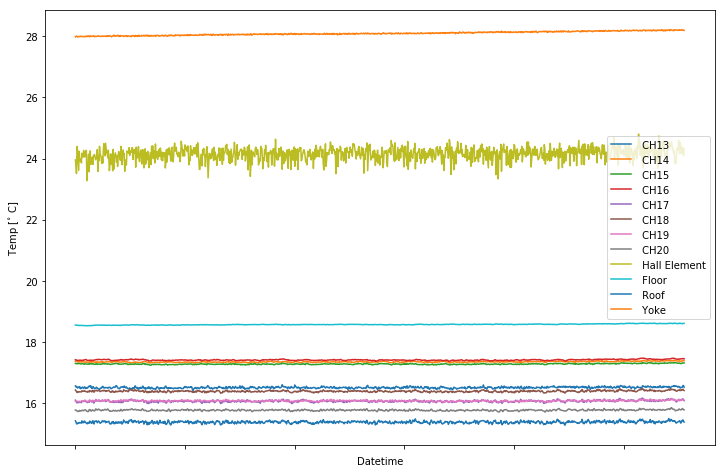

In [25]:
fig = plt.figure()
for c in temps_ch:
    df[c].plot()
#plt.ylabel('Temp [C]')
plt.ylabel("Temp [$^{\circ}$ C]")
plt.legend()    

In [26]:
fig = scatter2d([df.index for c in temps_ch],[df[c] for c in temps_ch],inline=True);
fig.layout.title = "Temp vs. Datetime"
fig.layout.yaxis.title = "Temp [deg. C]"

In [27]:
fname = 'temps_scatter'
pio.write_image(fig, plotdir+fname+'.pdf')
pio.write_image(fig, plotdir+fname+'.png')
plot(fig, filename=plotdir+fname+'.html')

'file:///home/ckampa/Coding/hallprobecalib_extras/plots/magnet_stability/2019-06-19/temps_scatter.html'

In [29]:
fig = scatter2d(df.index,df["CH21"],inline=True)

In [30]:
fig = scatter2d([df.index for c in temps_ch],[df[c]-(df[c].mean()-df[" Floor"].mean()) for c in temps_ch],inline=True);
fig.layout.title = "Temp vs. Datetime"
fig.layout.yaxis.title = "Temp [deg. C]"

In [31]:
fname = 'temps_scatter_adjusted'
pio.write_image(fig, plotdir+fname+'.pdf')
pio.write_image(fig, plotdir+fname+'.png')
plot(fig, filename=plotdir+fname+'.html')

'file:///home/ckampa/Coding/hallprobecalib_extras/plots/magnet_stability/2019-06-19/temps_scatter_adjusted.html'

In [32]:
fig = histo([df[c]-(df[c].mean()-df[" Floor"].mean()) for c in temps_ch],xlabel="Temperature (deg C)",verbosity=1,opacity=0.6,inline=True);
fig.layout.title = "Temp Histos"

In [33]:
fname = 'hist_temps_adjusted'
pio.write_image(fig, plotdir+fname+'.pdf')
pio.write_image(fig, plotdir+fname+'.png')
plot(fig, filename=plotdir+fname+'.html')

'file:///home/ckampa/Coding/hallprobecalib_extras/plots/magnet_stability/2019-06-19/hist_temps_adjusted.html'

In [34]:
fig = histo([df[c] for c in temps_ch],xlabel="Temperature (deg C)",verbosity=1,inline=True);
fig.layout.title = "Temp Histos"

In [35]:
fname = 'hist_temps'
pio.write_image(fig, plotdir+fname+'.pdf')
pio.write_image(fig, plotdir+fname+'.png')
plot(fig, filename=plotdir+fname+'.html')

'file:///home/ckampa/Coding/hallprobecalib_extras/plots/magnet_stability/2019-06-19/hist_temps.html'

In [36]:
fig = scatter2d(df.index,df[" Yoke"],inline=True);

In [37]:
fig = histo(df["CH21"],bins=50,inline=True);
pio.write_image(fig,plotdir+"hist_temp_Desk.pdf")
pio.write_image(fig,plotdir+"hist_temp_Desk.png")
fig = histo(df[" Floor"],bins=50,inline=True);
pio.write_image(fig,plotdir+"hist_temp_Floor.pdf")
pio.write_image(fig,plotdir+"hist_temp_Floor.png")

In [39]:
fig = histo(df[" Roof"],bins=50,inline=True);

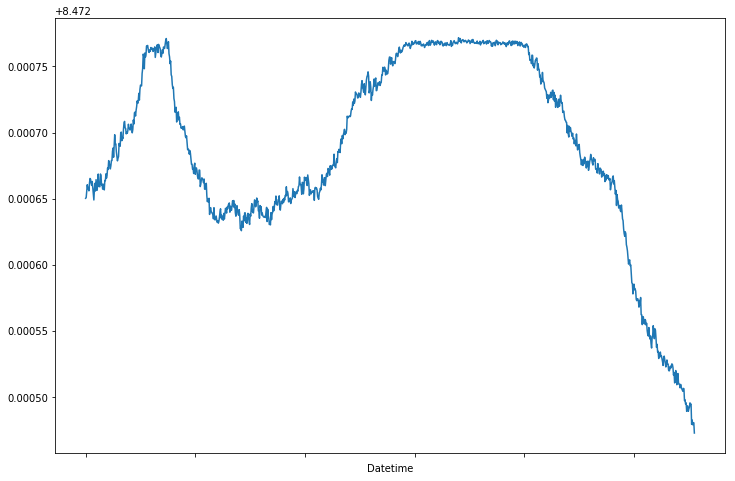

In [40]:
df[' Magnet Current [V]'].plot()

In [41]:
fig = scatter2d(df.index,df[' Magnet Current [V]'],inline=True);

In [42]:
fname = 'magnet_current'
pio.write_image(fig, plotdir+fname+'.pdf')
pio.write_image(fig, plotdir+fname+'.png')
plot(fig, filename=plotdir+fname+'.html')

'file:///home/ckampa/Coding/hallprobecalib_extras/plots/magnet_stability/2019-06-19/magnet_current.html'

In [43]:
fig = scatter2d(df.index,df[' Magnet Voltage [V]'],inline=True);

In [44]:
fname = 'magnet_voltage'
pio.write_image(fig, plotdir+fname+'.pdf')
pio.write_image(fig, plotdir+fname+'.png')
plot(fig, filename=plotdir+fname+'.html')

'file:///home/ckampa/Coding/hallprobecalib_extras/plots/magnet_stability/2019-06-19/magnet_voltage.html'

In [45]:
m =df[' Magnet Voltage [V]']
(m.max() - m.min()) / m.mean()

0.0013545139075725606

In [46]:
for col in df.columns:
    fig = scatter2d(df.index,df[col],lines=True,markers=False,size_list=[6], show_plot=False,inline=True);
    pio.write_image(fig,plotdir+f"time_series/{col}.pdf")
    pio.write_image(fig,plotdir+f"time_series/{col}.png")

## Correlations

- As seen in past dataset, NMR reading seems inversely correlated to the magnet voltage.
- It also appeared that the voltage was correlated to the water cooling system.
- Let's check if this relationship holds and also try to tease out other correlations.

In [105]:
import operator
from scipy import stats

In [106]:
primary_corr = dict()
for col in df.columns:
    if df[col].dtype == np.float64:
        slope_v, intercept_v, r_value_v, p_value_v, std_err_v = stats.linregress(df[col], df[" NMR [T]"])
        #print(col,r_value_v,p_value_v,std_err_v)
        primary_corr[col] = r_value_v

sorted_primary_corr = sorted(primary_corr.items(), key=operator.itemgetter(1))

sorted_primary_corr

[(' LCW in barrel', -0.9766021068270715),
 ('LCW to PS', -0.9687604657357334),
 (' ICW in', -0.9460786167035998),
 (' ICW He2 out', -0.9383477705684335),
 (' LCW to barrel', -0.9367862047612324),
 ('LCW to magnet', -0.935122307291798),
 (' Floor', -0.9308566075325436),
 (' ICW HE1 out', -0.929552609688022),
 (' Magnet Voltage [V]', -0.9194147229611218),
 (' Yoke', -0.9180117886564448),
 (' LCW out Coil 2', -0.9088670305259535),
 (' LCW in Coil1', -0.9022815245502783),
 (' LCW out Coil 1', -0.8949308622110833),
 (' Coil 2 (old)', -0.8562693161994142),
 (' LCW return magnet', -0.8349884555488539),
 (' LCW in Coil 2', -0.8296059142188432),
 ('Coil 1 (new)', -0.7856673271684039),
 (' LCW from PS', -0.7051453080801834),
 (' CH14', -0.6481150383566826),
 (' CH24', -0.6152278125337464),
 (' Tripplite HVAC exhaust', -0.6054564591145429),
 (' CH15', -0.6015573791250127),
 ('CH21', -0.5938301564053047),
 (' TrippLite HVAC supply', -0.5581100011598037),
 (' CH16', -0.5474231965581279),
 (' CH23',

Would be helpful to see time as the color to see how this is traced out.

In [48]:
df['ind'] = np.array([i for i in range(len(df))])

In [49]:
def color_scatter2d(x,y,ind,time=df.index,show_plot=True):
    data = [
        go.Scatter(
            x=x,
            y=y,
            marker=dict(
                size=2,
                cmax=ind.max(),
                cmin=ind.min(),
                color=ind,
                colorbar=dict(
                    title='time (index)',
                    #ticktext=df.index
                ),
                colorscale='Viridis',
            ),
            mode='markers',
            text=time,
        )
    ]
    
    layout = go.Layout(
        title = f"{y.name} vs. {x.name}",
        xaxis = dict(
            title = f"{x.name}"
        ),
        yaxis = dict(
            title = f"{y.name}"
        ),
    )

    fig = go.Figure(data=data,layout=layout)
    if show_plot:
        iplot(fig)
    return fig

In [54]:
for col in df.columns:
    fig = color_scatter2d(df[col],df[" NMR [T]"],df.ind,show_plot=False);
    pio.write_image(fig,plotdir+f"nmr_correlations/{col}_vs_nmr.pdf")
    pio.write_image(fig,plotdir+f"nmr_correlations/{col}_vs_nmr.png")

In [107]:
corr_main = " LCW in barrel"
#corr_main = " Yoke"
#slope, intercept, r_value, p_value, std_err = stats.linregress(df[" Yoke"], df[" NMR [T]"])
slope, intercept, r_value, p_value, std_err = stats.linregress(df[corr_main], df[" NMR [T]"])

In [108]:
slope, intercept, r_value, p_value, std_err

(-0.00010171542897449302,
 1.3212212543825408,
 -0.9766021068270715,
 0.0,
 6.725915533231932e-07)

In [109]:
line = slope * df[corr_main] + intercept

In [110]:
fig = scatter2d(2*[df[corr_main]],[df[" NMR [T]"],line],lines=False,markers=True,size_list=[2,2],inline=True)

In [111]:
pio.write_image(fig,plotdir+f"lcw_in_barrel_vs_nmr_fit.pdf")
pio.write_image(fig,plotdir+f"lcw_in_barrel_vs_nmr_fit.png")

In [137]:
df["NMR_const"] = df[" NMR [T]"] - slope * df[corr_main] - intercept + df[" NMR [T]"].mean()

In [138]:
fig = scatter2d(2*[df[corr_main]],[df["NMR_const"],line],lines=False,markers=True,size_list=[2,2],inline=True)

In [114]:
pio.write_image(fig,plotdir+f"lcw_in_barrel_vs_nmr_fit_subtract.pdf")
pio.write_image(fig,plotdir+f"lcw_in_barrel_vs_nmr_fit_subtract.png")

In [139]:
fig = histo(df[" NMR [T]"],bins=50,inline=True);
fig = histo(df["NMR_const"],bins=50,inline=True);
pio.write_image(fig,plotdir+f"lcw_in_barrel_correction_nmr_hist.pdf")
pio.write_image(fig,plotdir+f"lcw_in_barrel_correction_nmr_hist.png")

This looks nice. Let's try to remake the correlation plots on NMR_const.

In [140]:
secondary_corr = dict()
for col in df.columns:
    if df[col].dtype == np.float64:
        slope_v, intercept_v, r_value_v, p_value_v, std_err_v = stats.linregress(df[col], df["NMR_const"])
        #print(col,r_value_v,p_value_v,std_err_v)
        secondary_corr[col] = r_value_v

sorted_corr = sorted(secondary_corr.items(), key=operator.itemgetter(1))

sorted_corr

/home/ckampa/anaconda3/envs/Mu2E/lib/python3.7/site-packages/scipy/stats/_stats_mstats_common.py:107: RuntimeWarning:

invalid value encountered in double_scalars

/home/ckampa/anaconda3/envs/Mu2E/lib/python3.7/site-packages/scipy/stats/_stats_mstats_common.py:119: RuntimeWarning:

divide by zero encountered in double_scalars



[('CH21', -0.3885534646580409),
 (' PS internal', -0.35708653432636306),
 (' CH24', -0.3342385171995513),
 (' TrippLite HVAC supply', -0.3342153711992046),
 (' Tripplite HVAC exhaust', -0.3184286567926354),
 (' LCW return magnet', -0.3092980238619549),
 (' PS Vent1', -0.2880953495470907),
 (' CH23', -0.28127414245906424),
 (' CH26', -0.26926788942395785),
 (' PS Vent2', -0.23226815002473722),
 (' CH25', -0.20155589368342575),
 (' Floor', -0.18120676123362264),
 (' CH22', -0.18097757808333576),
 (' CH19', -0.16038782244760563),
 ('Parameter HVAC return', -0.1407857450572583),
 (' CH16', -0.13848643411811268),
 (' CH20', -0.12873344800184316),
 (' CH17', -0.08636742383956462),
 (' CH15', -0.0715346870247601),
 (' Hall Element', -0.07146851143024217),
 (' CH18', -0.07073819227352984),
 (' Roof', -0.06602205117202375),
 (' CH13', -0.061391518532199894),
 (' Yoke', -0.04546128697931081),
 (' CH14', -0.043426614329115425),
 ('LCW to PS', -0.015195553970804203),
 (' Parameter HVAC sensor', -0

In [102]:
for col in df.columns:
    fig = color_scatter2d(df[col],df["NMR_const"],df.ind,show_plot=False);
    pio.write_image(fig,plotdir+f"nmr_lcw_correlations/{col}_vs_nmr.pdf")
    pio.write_image(fig,plotdir+f"nmr_lcw_correlations/{col}_vs_nmr.png")

In [69]:
for col in df.columns:
    fig = color_scatter2d(df[col],df["NMR_const"],df.ind,show_plot=False);
    pio.write_image(fig,plotdir+f"nmr_const_correlations/{col}_vs_nmr.pdf")
    pio.write_image(fig,plotdir+f"nmr_const_correlations/{col}_vs_nmr.png")

The water temperature or maybe magnet voltage seem correlated now, except for a weird bit at the end. So we do a similar fit and subtract based on data with a time cut.

In [119]:
#fit_var = "Coil 1 (new)"
#fit_var = " ICW He2 out"
#fit_var = " CH15"
fit_var = " Magnet Current [V]"
fig = color_scatter2d(df[fit_var],df["NMR_const"],df.ind,show_plot=True);

In [106]:
#fit_var = " Magnet Voltage [V]"
t = df.ind < 3400
fig = color_scatter2d(df[t][fit_var],df[t]["NMR_const"],df.ind,show_plot=True);

In [138]:
slope_v, intercept_v, r_value_v, p_value_v, std_err_v = stats.linregress(df[t][fit_var], df[t]["NMR_const"])

In [139]:
slope_v, intercept_v, r_value_v, p_value_v, std_err_v

(6.297531422265082e-06,
 1.3185905589936644,
 0.5721276942604131,
 6.518264457785792e-295,
 1.5486978059512382e-07)

In [140]:
line_v = slope_v * df[fit_var] + intercept_v

In [141]:
fig = scatter2d(2*[df[fit_var]],[df["NMR_const"],line_v],lines=False,markers=True,size_list=[2,2],inline=True)

In [142]:
df["NMR_const_v"] = df["NMR_const"] - slope_v * df[fit_var] - intercept_v + df["NMR_const"].mean()

In [143]:
fig = scatter2d(2*[df[fit_var]],[df["NMR_const_v"],line_v],lines=False,markers=True,size_list=[2,2],inline=True)

In [144]:
fig = scatter2d(2*[df[" Yoke"]],[df["NMR_const"],df["NMR_const_v"]],lines=False,markers=True,size_list=[2,2],inline=True)

In [145]:
histo(df[" NMR [T]"],bins=50,inline=True);
histo(df["NMR_const"],bins=50,inline=True);
histo(df["NMR_const_v"],bins=50,inline=True);

In [146]:
fig = scatter2d(df.index,df["NMR_const_v"],lines=False,markers=True,inline=True)

In [147]:
fig = scatter2d(df[" Yoke"],df["NMR_const_v"],lines=False,markers=True,inline=True)

In [120]:
slope_v, intercept_v, r_value_v, p_value_v, std_err_v = stats.linregress(df[fit_var], df["NMR_const"])

In [121]:
slope_v, intercept_v, r_value_v, p_value_v, std_err_v

(0.012201686510950032,
 1.215232109827265,
 0.38479939589951706,
 1.587551471867713e-40,
 0.0008788636806723389)

In [122]:
line_v = slope_v * df[fit_var] + intercept_v

In [133]:
fig = scatter2d(2*[df[fit_var]],[df["NMR_const"],line_v],lines=False,markers=True,size_list=[2,2],inline=True)

In [134]:
pio.write_image(fig,plotdir+'current_vs_nmr_corr.pdf')
pio.write_image(fig,plotdir+'current_vs_nmr_corr.png')

In [124]:
df["NMR_const_v"] = df["NMR_const"] - slope_v * df[fit_var] - intercept_v + df["NMR_const"].mean()

In [125]:
fig = scatter2d(2*[df[fit_var]],[df["NMR_const_v"],line_v],lines=False,markers=True,size_list=[2,2],inline=True)

In [127]:
fig = scatter2d(2*[df[" Yoke"]],[df["NMR_const"],df["NMR_const_v"]],lines=False,markers=True,size_list=[2,2],inline=True)

In [132]:
histo(df[" NMR [T]"],bins=50,inline=True);
histo(df["NMR_const"],bins=50,inline=True);
fig = histo(df["NMR_const_v"],bins=50,inline=True);
pio.write_image(fig,plotdir+'hist_lcw_and_current_nmr.pdf')
pio.write_image(fig,plotdir+'hist_lcw_and_current_nmr.png')

In [129]:
fig = scatter2d(df.index,df["NMR_const_v"],lines=False,markers=True,inline=True)

In [130]:
secondary_corr = dict()
for col in df.columns:
    if df[col].dtype == np.float64:
        slope_v, intercept_v, r_value_v, p_value_v, std_err_v = stats.linregress(df[col], df["NMR_const"])
        #print(col,r_value_v,p_value_v,std_err_v)
        secondary_corr[col] = r_value_v

sorted_corr = sorted(secondary_corr.items(), key=operator.itemgetter(1))

sorted_corr

[('CH21', -0.3885534646580409),
 (' PS internal', -0.35708653432636306),
 (' CH24', -0.3342385171995513),
 (' TrippLite HVAC supply', -0.3342153711992046),
 (' Tripplite HVAC exhaust', -0.3184286567926354),
 (' LCW return magnet', -0.3092980238619549),
 (' PS Vent1', -0.2880953495470907),
 (' CH23', -0.28127414245906424),
 (' CH26', -0.26926788942395785),
 (' PS Vent2', -0.23226815002473722),
 (' CH25', -0.20155589368342575),
 (' Floor', -0.18120676123362264),
 (' CH22', -0.18097757808333576),
 (' CH19', -0.16038782244760563),
 ('Parameter HVAC return', -0.1407857450572583),
 (' CH16', -0.13848643411811268),
 (' CH20', -0.12873344800184316),
 (' CH17', -0.08636742383956462),
 (' CH15', -0.0715346870247601),
 (' Hall Element', -0.07146851143024217),
 (' CH18', -0.07073819227352984),
 (' Roof', -0.06602205117202375),
 (' CH13', -0.061391518532199894),
 (' Yoke', -0.04546128697931081),
 (' CH14', -0.043426614329115425),
 ('LCW to PS', -0.015195553970804203),
 (' Parameter HVAC sensor', -0

## Slope of changes

In [116]:
df.drop([" "],axis=1,inplace=True)

In [117]:
df.columns

Index(['Time', ' Magnet Current [V]', ' Magnet Voltage [V]', 'Coil 1 (new)',
       ' Coil 2 (old)', ' LCW in Coil1', ' LCW out Coil 1', ' LCW in Coil 2',
       ' LCW out Coil 2', ' Yoke', ' Hall Element', ' Floor', ' Roof',
       'Parameter HVAC return', ' Parameter HVAC sensor', ' CH13', ' CH14',
       ' CH15', ' CH16', ' CH17', ' CH18', ' CH19', ' CH20', 'CH21', ' CH22',
       ' CH23', ' CH24', ' CH25', ' CH26', ' PS internal', ' PS Vent1',
       ' PS Vent2', ' TrippLite HVAC supply', ' Tripplite HVAC exhaust',
       'LCW to PS', ' LCW in barrel', ' ICW in', ' ICW HE1 out',
       ' ICW He2 out', ' LCW return magnet', ' LCW to barrel', ' LCW from PS',
       'LCW to magnet', ' NMR [T]', ' NMR [FFT]', ' Zaber_Meas_MicroStep_X',
       ' Zaber_Meas_Encoder_X', '  Zaber_Meas_MicroStep_Y',
       ' Zaber_Meas_Encoder_Y', '  Zaber_Meas_MicroStep_Z',
       ' Zaber_Meas_Encoder_Z', 'ind', 'NMR_const', 'NMR_const_v'],
      dtype='object')

In [118]:
col_float = [col for col in df.columns if df[col].dtype == np.float64]

In [119]:
col_float

[' Magnet Current [V]',
 ' Magnet Voltage [V]',
 'Coil 1 (new)',
 ' Coil 2 (old)',
 ' LCW in Coil1',
 ' LCW out Coil 1',
 ' LCW in Coil 2',
 ' LCW out Coil 2',
 ' Yoke',
 ' Hall Element',
 ' Floor',
 ' Roof',
 'Parameter HVAC return',
 ' Parameter HVAC sensor',
 ' CH13',
 ' CH14',
 ' CH15',
 ' CH16',
 ' CH17',
 ' CH18',
 ' CH19',
 ' CH20',
 'CH21',
 ' CH22',
 ' CH23',
 ' CH24',
 ' CH25',
 ' CH26',
 ' PS internal',
 ' PS Vent1',
 ' PS Vent2',
 ' TrippLite HVAC supply',
 ' Tripplite HVAC exhaust',
 'LCW to PS',
 ' LCW in barrel',
 ' ICW in',
 ' ICW HE1 out',
 ' ICW He2 out',
 ' LCW return magnet',
 ' LCW to barrel',
 ' LCW from PS',
 'LCW to magnet',
 ' NMR [T]',
 ' NMR [FFT]',
 ' Zaber_Meas_MicroStep_X',
 ' Zaber_Meas_Encoder_X',
 '  Zaber_Meas_MicroStep_Y',
 ' Zaber_Meas_Encoder_Y',
 '  Zaber_Meas_MicroStep_Z',
 ' Zaber_Meas_Encoder_Z',
 'NMR_const',
 'NMR_const_v']

In [120]:
#temp = df[' Yoke']

In [121]:
slopes = df[col_float].apply(lambda x: np.polyfit(df.ind, x, 1)[0])

In [122]:
slopes

 Magnet Current [V]        -1.645282e-08
 Magnet Voltage [V]        -1.555289e-05
Coil 1 (new)               -9.534695e-05
 Coil 2 (old)              -7.860980e-05
 LCW in Coil1              -1.190017e-04
 LCW out Coil 1            -1.182661e-04
 LCW in Coil 2             -1.099698e-04
 LCW out Coil 2            -1.132179e-04
 Yoke                      -7.516065e-05
 Hall Element              -1.686016e-05
 Floor                     -8.048303e-05
 Roof                      -7.165264e-05
Parameter HVAC return      -7.776762e-05
 Parameter HVAC sensor     -7.320478e-05
 CH13                      -8.866880e-05
 CH14                      -9.465698e-05
 CH15                      -9.998848e-05
 CH16                      -8.932704e-05
 CH17                      -8.662483e-05
 CH18                      -8.548355e-05
 CH19                      -8.446150e-05
 CH20                      -7.921378e-05
CH21                       -1.124420e-04
 CH22                      -4.523067e-05
 CH23           

In [53]:
[df[" NMR [T]"][i+1] - row[" NMR [T]"] for i,row in enumerate(df.itertuples())]

TypeError: tuple indices must be integers or slices, not str

In [123]:
t_outside = df["CH21"].values
t_inside = df[" Yoke"].values
t_inside2 = df[" Floor"].values

In [124]:
slope_inside = [t_inside[i+1]-t_inside[i] for i in range(len(t_inside)-1)]
slope_inside.append(0)
slope_inside = pd.Series(slope_inside,name="Inside Temp Change: Yoke")
slope_inside2 = [t_inside[i+1]-t_inside[i] for i in range(len(t_inside)-1)]
slope_inside2.append(0)
slope_inside2 = pd.Series(slope_inside2,name="Inside Temp Change: Floor")

In [125]:
fig = scatter2d(df.index,slope_inside,inline=True);

In [126]:
pio.write_image(fig, plotdir+"temp_change_Yoke.pdf")
pio.write_image(fig, plotdir+"temp_change_Yoke.png")

In [127]:
fig = scatter2d(df.index,slope_inside2,inline=True);

In [128]:
pio.write_image(fig, plotdir+"temp_change_Floor.pdf")
pio.write_image(fig, plotdir+"temp_change_Floor.png")

In [129]:
slope_outside = [t_outside[i+1]-t_outside[i] for i in range(len(t_outside)-1)]
slope_outside.append(0)
slope_outside = pd.Series(slope_outside,name="Outside Temp Change")

In [130]:
fig = scatter2d(df.index,slope_outside,inline=True);

In [131]:
pio.write_image(fig, plotdir+"temp_change_Desk.pdf")
pio.write_image(fig, plotdir+"temp_change_Desk.png")

In [132]:
fig = histo(slope_inside,bins=50,xlabel="Temp Change (deg / min)",inline=True);
pio.write_image(fig, plotdir+"hist_temp_change_Yoke.pdf")
pio.write_image(fig, plotdir+"hist_temp_change_Yoke.png")
fig = histo(slope_inside2,bins=50,xlabel="Temp Change (deg / min)",inline=True);
pio.write_image(fig, plotdir+"hist_temp_change_Floor.pdf")
pio.write_image(fig, plotdir+"hist_temp_change_Floor.png")
fig = histo(slope_outside,bins=50,xlabel="Temp Change (deg / min)",inline=True);
pio.write_image(fig, plotdir+"hist_temp_change_Desk.pdf")
pio.write_image(fig, plotdir+"hist_temp_change_Desk.png")

In [ ]:
-1.8e-4 * 